In [2]:
import pandas as pd

# Update this path based on your actual dataset name
csv_path = '/kaggle/input/cv-gait-inputs/GAVD_with_correct_paths.csv'

# Load the CSV file
gait_df = pd.read_csv(csv_path)

# Display basic info about the dataframe
print("Dataframe Info:")
print(gait_df.info())


Dataframe Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79738 entries, 0 to 79737
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   seq             79738 non-null  object
 1   frame_num       79738 non-null  int64 
 2   cam_view        79738 non-null  object
 3   dataset         79738 non-null  object
 4   gait_pat        79738 non-null  object
 5   vid_info        79738 non-null  object
 6   id              79738 non-null  object
 7   url             79738 non-null  object
 8   stratify_group  79738 non-null  object
 9   frame_path      79738 non-null  object
dtypes: int64(1), object(9)
memory usage: 6.1+ MB
None


In [3]:
# Show a sample of the data
print("\nSample Data:")
gait_df.head()


Sample Data:


,seq,frame_num,cam_view,dataset,gait_pat,vid_info,id,url,stratify_group,frame_path
0,cljaqqdar00aa3n6lblt5iei7,1807,front,Abnormal Gait,abnormal,"{'height': 720, 'width': 1280, 'mime_type': 'v...",N9tJ7I4ls6I,https://www.youtube.com/watch?v=N9tJ7I4ls6I,Abnormal Gait_abnormal,/kaggle/input/gavd-frames/GAVD_frames/N9tJ7I4l...
1,cll7qs7tb007w3o6lxsdgc4ui,1717,front,Abnormal Gait,abnormal,"{'height': 360, 'width': 640, 'mime_type': 'vi...",N9tJ7I4ls6I,https://www.youtube.com/watch?v=N9tJ7I4ls6I,Abnormal Gait_abnormal,/kaggle/input/gavd-frames/GAVD_frames/N9tJ7I4l...
2,cll8i1ry6000h3o6lro9qix4i,1632,left side,Abnormal Gait,abnormal,"{'height': 480, 'width': 854, 'mime_type': 'vi...",Rk7vzPpvQ_E,https://www.youtube.com/watch?v=Rk7vzPpvQ_E,Abnormal Gait_abnormal,/kaggle/input/gavd-frames/GAVD_frames/Rk7vzPpv...
3,cll7b64pr001j3o6l51wteo3i,1089,right side,Abnormal Gait,abnormal,"{'height': 480, 'width': 854, 'mime_type': 'vi...",IV_IsstW-gA,https://www.youtube.com/watch?v=IV_IsstW-gA,Abnormal Gait_abnormal,/kaggle/input/gavd-frames/GAVD_frames/IV_IsstW...
4,cll7o3c6p002p3o6ldijxknj2,2848,front,Abnormal Gait,abnormal,"{'height': 480, 'width': 854, 'mime_type': 'vi...",k_u1odxxsWY,https://www.youtube.com/watch?v=k_u1odxxsWY,Abnormal Gait_abnormal,/kaggle/input/gavd-frames/GAVD_frames/k_u1odxx...


In [4]:
# Remove rows with missing frame paths
gait_df.dropna(subset=['frame_path'], inplace=True)

# Verify the data cleanup
print("\nAfter Dropping Missing Frame Paths:")
print(gait_df.info())



After Dropping Missing Frame Paths:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79738 entries, 0 to 79737
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   seq             79738 non-null  object
 1   frame_num       79738 non-null  int64 
 2   cam_view        79738 non-null  object
 3   dataset         79738 non-null  object
 4   gait_pat        79738 non-null  object
 5   vid_info        79738 non-null  object
 6   id              79738 non-null  object
 7   url             79738 non-null  object
 8   stratify_group  79738 non-null  object
 9   frame_path      79738 non-null  object
dtypes: int64(1), object(9)
memory usage: 6.1+ MB
None


In [5]:
# Remove duplicates
gait_df.drop_duplicates(inplace=True)

In [6]:
# Verify the cleanup
print("\nData Summary After Cleanup:")
print(gait_df.info())


Data Summary After Cleanup:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79738 entries, 0 to 79737
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   seq             79738 non-null  object
 1   frame_num       79738 non-null  int64 
 2   cam_view        79738 non-null  object
 3   dataset         79738 non-null  object
 4   gait_pat        79738 non-null  object
 5   vid_info        79738 non-null  object
 6   id              79738 non-null  object
 7   url             79738 non-null  object
 8   stratify_group  79738 non-null  object
 9   frame_path      79738 non-null  object
dtypes: int64(1), object(9)
memory usage: 6.1+ MB
None


In [7]:
print("\nGait Pattern Distribution:")
print(gait_df['gait_pat'].value_counts())



Gait Pattern Distribution:
gait_pat
stroke            10422
cerebral palsy    10418
exercise          10404
abnormal          10373
myopathic         10330
prosthetic        10162
parkinsons         9543
normal             8086
Name: count, dtype: int64


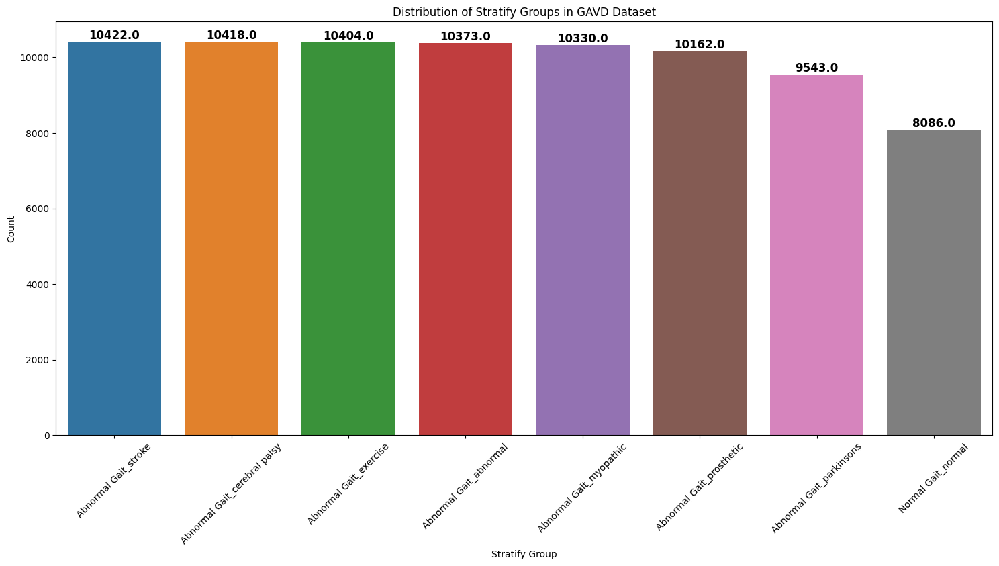

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import pandas as pd


# Plot the distribution of stratify groups as vertical bars
plt.figure(figsize=(18, 8))
ax = sns.countplot(x=gait_df['stratify_group'], order=gait_df['stratify_group'].value_counts().index)

# Add counts on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=12, color='black', fontweight='bold')

plt.title("Distribution of Stratify Groups in GAVD Dataset")
plt.xlabel("Stratify Group")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

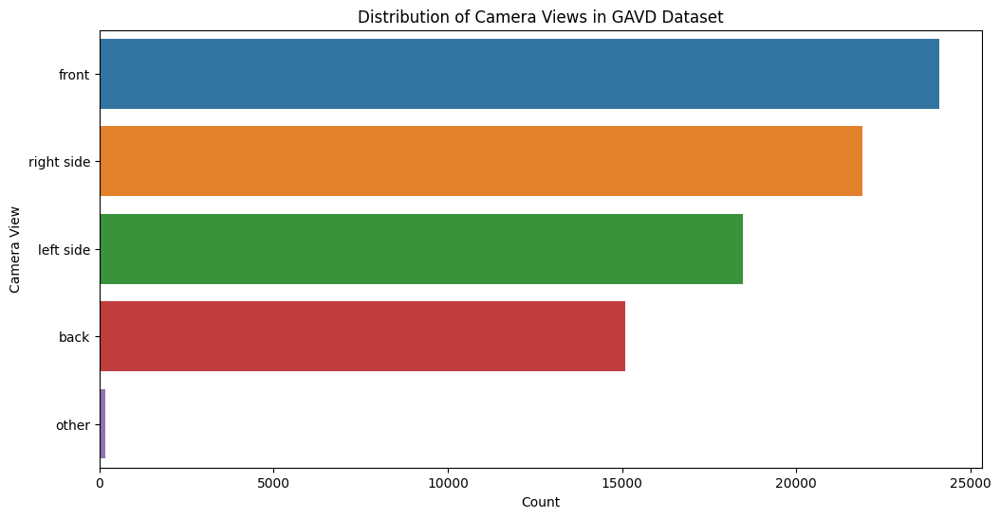

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of camera views
plt.figure(figsize=(12, 6))
sns.countplot(y=gait_df['cam_view'], order=gait_df['cam_view'].value_counts().index)
plt.title("Distribution of Camera Views in GAVD Dataset")
plt.xlabel("Count")
plt.ylabel("Camera View")
plt.show()

In [10]:
# Fix frame_path to point to Kaggle's actual frame directory
gait_df['frame_path'] = gait_df['frame_path'].apply(
    lambda p: os.path.join('/kaggle/input/gavd-frames/GAVD_frames', os.path.basename(p))
)


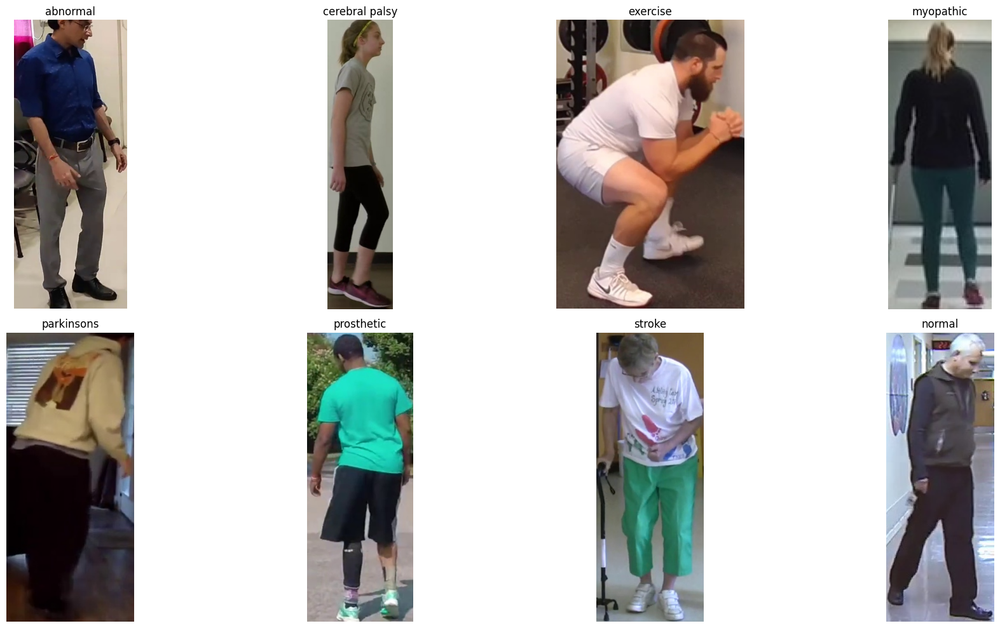

In [11]:
import matplotlib.pyplot as plt
import cv2
import os

# Get unique gait patterns
unique_gait_pats = gait_df['gait_pat'].unique()

# Define layout
images_per_row = 4
num_rows = (len(unique_gait_pats) + images_per_row - 1) // images_per_row

# Set up the plot size
plt.figure(figsize=(5 * images_per_row, 5 * num_rows))

for i, gait_pat in enumerate(unique_gait_pats):
    # Find a row corresponding to the current gait_pat
    subset = gait_df[gait_df['gait_pat'] == gait_pat]
    if subset.empty or len(subset) < 1:
        continue

    row = subset.iloc[35]  # Safely get the first matching row
    img_path = row['frame_path']

    if os.path.exists(img_path):
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.subplot(num_rows, images_per_row, i + 1)
        plt.imshow(image)
        plt.title(f"{gait_pat}")
        plt.axis('off')
    else:
        print(f"⚠️ Not found: {img_path}")

plt.tight_layout()
plt.show()


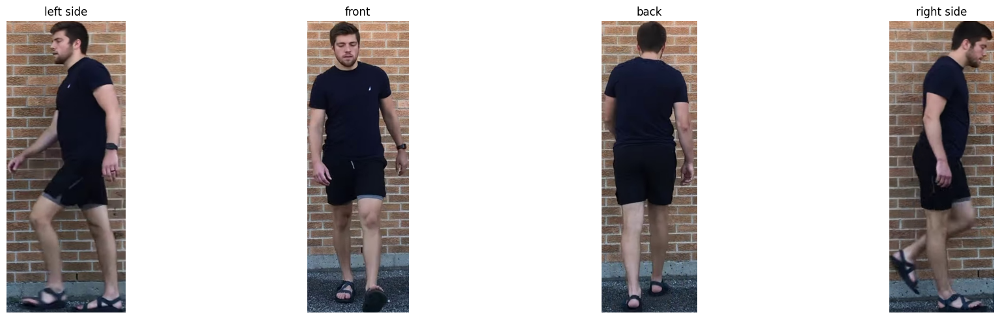

In [12]:
# Define the specific image identifier that has multiple camera views
image_id = 'kqoUzTyn_k4'  # Replace with any ID that has multiple views

# Get all rows for this image_id with different camera views
rows = gait_df[gait_df['frame_path'].str.contains(image_id)]

# Set up the plot size (adjust the number of columns accordingly)
plt.figure(figsize=(5 * len(rows['cam_view'].unique()), 5))

# Loop through each camera view for the selected image
for j, cam_view in enumerate(rows['cam_view'].unique()):
    # Find the row for the selected image and cam_view
    row = rows[rows['cam_view'] == cam_view].iloc[0]
    img_path = row['frame_path']


    if os.path.exists(img_path):
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display image in a subplot for each camera view
        plt.subplot(1, len(rows['cam_view'].unique()), j + 1)
        plt.imshow(image)
        plt.title(f"{cam_view}")
        plt.axis('off')
    else:
        print(f"⚠️ Not found: {img_path}")

plt.tight_layout()
plt.show()


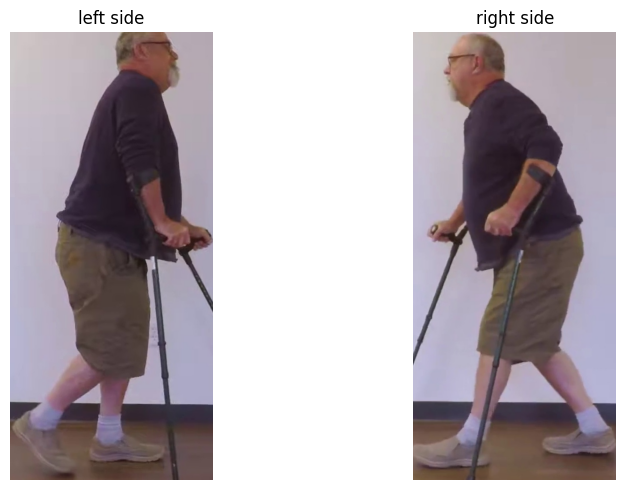

In [13]:
# Define the specific image identifier that has multiple camera views
image_id = 'O1QibgYaKbY'  # Replace with any ID that has multiple views

# Get all rows for this image_id with different camera views
rows = gait_df[gait_df['frame_path'].str.contains(image_id)]

# Set up the plot size (adjust the number of columns accordingly)
plt.figure(figsize=(5 * len(rows['cam_view'].unique()), 5))

# Loop through each camera view for the selected image
for j, cam_view in enumerate(rows['cam_view'].unique()):
    # Find the row for the selected image and cam_view
    row = rows[rows['cam_view'] == cam_view].iloc[0]
    img_path = row['frame_path']


    if os.path.exists(img_path):
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display image in a subplot for each camera view
        plt.subplot(1, len(rows['cam_view'].unique()), j + 1)
        plt.imshow(image)
        plt.title(f"{cam_view}")
        plt.axis('off')
    else:
        print(f"⚠️ Not found: {img_path}")

plt.tight_layout()
plt.show()


In [14]:
!pip uninstall -y protobuf


Found existing installation: protobuf 3.20.3
Uninstalling protobuf-3.20.3:
  Successfully uninstalled protobuf-3.20.3


In [15]:
!pip install --force-reinstall /kaggle/input/cv-gait-inputs/protobuf-6.30.2-py3-none-any.whl


Processing /kaggle/input/cv-gait-inputs/protobuf-6.30.2-py3-none-any.whl
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-translate 3.12.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 6.30.2 which is incompatible.
google-api-core 1.34.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<4.0.0dev,>=3.19.5, but you have protobuf 6.30.2 which is incompatible.
google-cloud-functions 1.19.0 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<6.0.0dev,>=3.20.2, but you have protobuf 6.30.2 which is incompatible.
tensorflow-metadata 1.16.1 requires protobuf<6.0.0dev,>=4.25.2; python_version >= "3.11", but you have protobuf 6.30.2 which is incompatible.
google-cloud-iam 2.18.0 requires protobuf!=4.21.0,!=4.21.1,!=4

In [16]:
!pip install --no-deps /kaggle/input/cv-gait-inputs/mediapipe-0.10.21-cp311-cp311-manylinux_2_28_x86_64.whl


Processing /kaggle/input/cv-gait-inputs/mediapipe-0.10.21-cp311-cp311-manylinux_2_28_x86_64.whl


In [17]:
import mediapipe as mp
print("✅ MediaPipe installed successfully!")


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

2025-05-13 02:57:26.469450: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747105046.647787      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747105046.698552      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

✅ MediaPipe installed successfully!


In [18]:
import os

# Set the path to the uploaded models
model_base_path = '/kaggle/input/mediapipe-models1'

# Create the necessary directories for MediaPipe
mediapipe_model_path = '/usr/local/lib/python3.11/dist-packages/mediapipe/modules/pose_landmark'
os.makedirs(mediapipe_model_path, exist_ok=True)

# Copy the models to the correct directory
!cp {model_base_path}/pose_landmark_heavy.tflite {mediapipe_model_path}/pose_landmark_heavy.tflite
!cp {model_base_path}/pose_landmark_full.tflite {mediapipe_model_path}/pose_landmark_full.tflite
!cp {model_base_path}/pose_detection.tflite /usr/local/lib/python3.11/dist-packages/mediapipe/modules/pose_detection/pose_detection.tflite

print("✅ MediaPipe models successfully copied to the correct directory.")


✅ MediaPipe models successfully copied to the correct directory.


In [19]:
import pandas as pd

# Load the main CSV
main_csv_path = '/kaggle/input/cv-gait-inputs/GAVD_with_correct_paths.csv'
gait_df = pd.read_csv(main_csv_path)

# Remove rows with empty or NaN frame paths
gait_df.dropna(subset=['frame_path'], inplace=True)

# Convert all paths to strings
gait_df['frame_path'] = gait_df['frame_path'].astype(str)

# Replace Google Drive paths with Kaggle paths
frames_base_path = '/kaggle/input/gavd-frames/GAVD_frames'
gait_df['frame_path'] = gait_df['frame_path'].apply(lambda x: x.replace('/content/drive/MyDrive/CV_Project/GAVD_frames/', frames_base_path))

# Save the corrected CSV
gait_df.to_csv('/kaggle/working/GAVD_with_correct_paths1.csv', index=False)

print("\n✅ Frame paths corrected and saved to GAVD_with_correct_paths1.csv")



✅ Frame paths corrected and saved to GAVD_with_correct_paths1.csv


In [20]:
import torch

if torch.cuda.is_available():
    print(f"✅ GPU is connected: {torch.cuda.get_device_name(0)}")
    print(f"📝 GPU Memory Allocated: {torch.cuda.memory_allocated(0) / 1024 ** 2:.2f} MB")
    print(f"🔋 GPU Memory Reserved: {torch.cuda.memory_reserved(0) / 1024 ** 2:.2f} MB")
else:
    print("❌ No GPU found. Please enable GPU from the Kaggle settings.")


✅ GPU is connected: Tesla P100-PCIE-16GB
📝 GPU Memory Allocated: 0.00 MB
🔋 GPU Memory Reserved: 0.00 MB


In [28]:
import pandas as pd
df = pd.read_csv('/kaggle/working/GAVD_with_keypoints_cleaned.csv')
print("✅ Rows with keypoints saved:", len(df))


✅ Rows with keypoints saved: 74125


In [ ]:
import os
import cv2
import mediapipe as mp
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import torch
import warnings
import logging
import absl.logging
import sys
import ast

# Suppress all absl and TensorFlow logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['GLOG_minloglevel'] = '3'
os.environ['MEDIAPIPE_DISABLE_FEEDBACK_MANAGER'] = '1'

absl.logging.set_verbosity(absl.logging.ERROR)
logging.getLogger('absl').setLevel(logging.ERROR)

# Suppress C++ warnings by redirecting stderr
stderr = sys.stderr
devnull = open(os.devnull, 'w')
sys.stderr = devnull

# Paths adapted for Kaggle
corrected_csv_path = '/kaggle/working/GAVD_with_correct_paths1.csv'
output_csv_path = '/kaggle/working/GAVD_with_keypoints_cleaned.csv'
error_log_path = '/kaggle/working/missing_frames.txt'
no_landmarks_log_path = '/kaggle/working/no_landmarks.txt'

# Load the CSV
gait_df = pd.read_csv(corrected_csv_path)
gait_df.dropna(subset=['frame_path'], inplace=True)
gait_df.drop_duplicates(inplace=True)
gait_df.reset_index(drop=True, inplace=True)

# Initialize MediaPipe
mp_pose = mp.solutions.pose

# Clear previous logs
open(error_log_path, 'w').close()
open(no_landmarks_log_path, 'w').close()

# Use GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🚀 Using device: {device}")

def is_back_view(keypoints):
    """
    Detect if the person is facing backwards based on shoulder and hip positions.
    """
    # Extract left and right shoulder (11, 12) and hip (23, 24) keypoints
    left_shoulder_x, _, _ = keypoints[11]
    right_shoulder_x, _, _ = keypoints[12]
    left_hip_x, _, _ = keypoints[23]
    right_hip_x, _, _ = keypoints[24]

    # Check if left keypoints are to the right of right keypoints (possible back view)
    return left_shoulder_x > right_shoulder_x and left_hip_x > right_hip_x

def correct_back_view(keypoints):
    """
    Corrects keypoints if a back view is detected.
    """
    keypoints = np.array(keypoints).reshape(-1, 3)

    # Swap left and right keypoints
    swap_indices = [
        (11, 12),  # Shoulders
        (13, 14),  # Elbows
        (15, 16),  # Wrists
        (23, 24),  # Hips
        (25, 26),  # Knees
        (27, 28),  # Ankles
        (29, 30),  # Heels
        (31, 32)   # Feet
    ]
    
    for left, right in swap_indices:
        keypoints[[left, right]] = keypoints[[right, left]]

    return keypoints.flatten()

def normalize_keypoints(keypoints):
    """
    Normalizes keypoints to ensure they are within valid ranges.
    """
    keypoints = np.array(keypoints).reshape(-1, 3)
    keypoints[:, 0] = np.clip(keypoints[:, 0], 0, 1)
    keypoints[:, 1] = np.clip(keypoints[:, 1], 0, 1)
    keypoints[:, 2] = np.clip(keypoints[:, 2], -1, 1)  # Z can be negative
    return keypoints.flatten()

def extract_keypoints(image_path, cam_view):
    try:
        # Read the image
        image = cv2.imread(image_path)
        if image is None:
            # Log missing frames
            with open(error_log_path, 'a') as f:
                f.write(image_path + '\n')
            return None
        
        # Process the image to get keypoints
        with mp_pose.Pose(static_image_mode=True, model_complexity=2) as pose:
            results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            if results.pose_landmarks:
                keypoints = [(lm.x, lm.y, lm.z) for lm in results.pose_landmarks.landmark]
                
                # Handle side views (mirror correction)
                if cam_view == 'left side':
                    keypoints = [(1 - x, y, z) for x, y, z in keypoints]
                
                # Correct back views if detected
                if is_back_view(keypoints):
                  
                    keypoints = correct_back_view(keypoints)

                # Normalize keypoints for consistency
                keypoints = normalize_keypoints(keypoints)
                return np.array(keypoints).flatten().tolist()
            else:
                # Log frames without landmarks
                with open(no_landmarks_log_path, 'a') as f:
                    f.write(image_path + '\n')
                return None
    except Exception as e:
        # Log any unexpected errors
        with open(error_log_path, 'a') as f:
            f.write(f"{image_path}: {str(e)}\n")
        return None

# Apply extraction
tqdm.pandas()
gait_df['keypoints'] = gait_df.progress_apply(lambda row: extract_keypoints(row['frame_path'], row['cam_view']), axis=1)

# Clean and save
gait_df.dropna(subset=['keypoints'], inplace=True)
gait_df.reset_index(drop=True, inplace=True)
gait_df.to_csv(output_csv_path, index=False)


# Restore stderr after processing
sys.stderr = stderr

print("\n✅ Keypoint Extraction Completed. Data saved to /kaggle/working/GAVD_with_keypoints_cleaned.csv")

🚀 Using device: cuda


  0%|          | 0/79738 [00:00<?, ?it/s]

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1747105062.837066     111 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1747105063.004476     111 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1747105063.070194     111 landmark_projection_calculator.cc:186] Using NORM_RECT without IMAGE_DIMENSIONS is only supported for the square ROI. Provide IMAGE_DIMENSIONS or use PROJECTION_MATRIX.
W0000 00:00:1747105063.190646     113 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1747105063.380817     113 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the cleaned keypoints CSV
cleaned_csv_path = '/kaggle/working/GAVD_with_keypoints_cleaned.csv'
gait_df = pd.read_csv(cleaned_csv_path)

# Print basic info
print("\n✅ Keypoint Data Loaded Successfully")
print("\nDataFrame Info:")
print(gait_df.info())

# Sample a few rows to confirm data structure
print("\nSample Data:")
print(gait_df[['frame_path', 'keypoints']].sample(5))



✅ Keypoint Data Loaded Successfully

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74125 entries, 0 to 74124
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   seq             74125 non-null  object
 1   frame_num       74125 non-null  int64 
 2   cam_view        74125 non-null  object
 3   dataset         74125 non-null  object
 4   gait_pat        74125 non-null  object
 5   vid_info        74125 non-null  object
 6   id              74125 non-null  object
 7   url             74125 non-null  object
 8   stratify_group  74125 non-null  object
 9   frame_path      74125 non-null  object
 10  keypoints       74125 non-null  object
dtypes: int64(1), object(10)
memory usage: 6.2+ MB
None

Sample Data:
                                              frame_path  \
22731  /kaggle/input/gavd-frames/GAVD_frames/YN0QlXQC...   
65155  /kaggle/input/gavd-frames/GAVD_frames/FpXbeLZW...   
17011  /kaggle/

In [30]:
# Verify keypoint lengths
gait_df['keypoint_length'] = gait_df['keypoints'].apply(lambda x: len(eval(x)) if isinstance(x, str) else 0)
invalid_keypoints = gait_df[gait_df['keypoint_length'] != 99]

if len(invalid_keypoints) > 0:
    print(f"\n⚠️ Found {len(invalid_keypoints)} rows with invalid keypoint dimensions:")
    print(invalid_keypoints[['frame_path', 'keypoint_length']].head())
else:
    print("\n✅ All keypoints have the correct 99-dimensional structure.")



✅ All keypoints have the correct 99-dimensional structure.


In [31]:
missing_keypoints = gait_df[gait_df['keypoints'].isna()]
if len(missing_keypoints) > 0:
    print(f"\n⚠️ Found {len(missing_keypoints)} rows with missing keypoints:")
    print(missing_keypoints[['frame_path', 'keypoints']].head())
else:
    print("\n✅ No missing keypoints detected.")



✅ No missing keypoints detected.


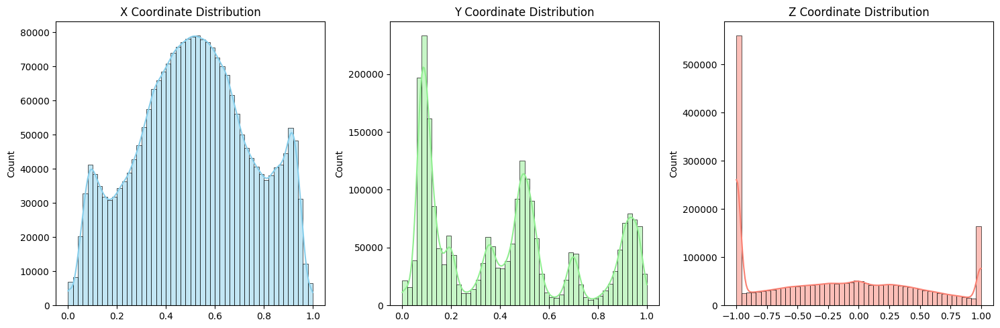

In [32]:
import matplotlib.pyplot as plt

# Extract and flatten all keypoints
all_keypoints = np.array([eval(kp) for kp in gait_df['keypoints']])

# Plot distributions
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
sns.histplot(all_keypoints[:, ::3].flatten(), bins=50, kde=True, color='skyblue')
plt.title('X Coordinate Distribution')

plt.subplot(1, 3, 2)
sns.histplot(all_keypoints[:, 1::3].flatten(), bins=50, kde=True, color='lightgreen')
plt.title('Y Coordinate Distribution')

plt.subplot(1, 3, 3)
sns.histplot(all_keypoints[:, 2::3].flatten(), bins=50, kde=True, color='salmon')
plt.title('Z Coordinate Distribution')

plt.tight_layout()
plt.show()


Selected Frame: /kaggle/input/gavd-frames/GAVD_frames/pguRGW0G6vU_2415_p0.jpg
Keypoints Shape: (33, 3)


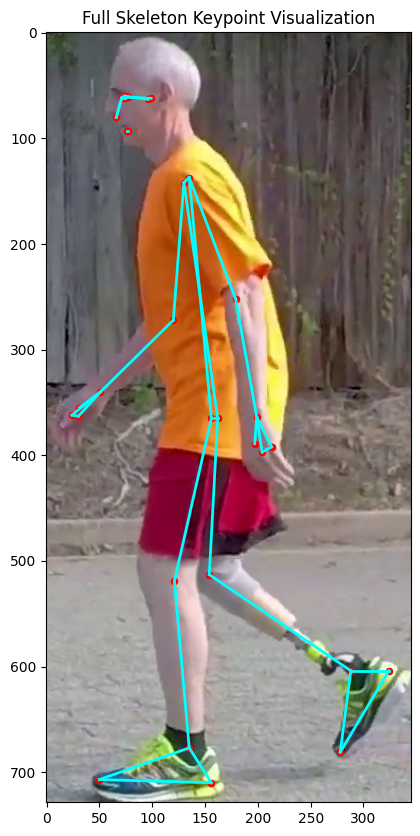

In [34]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import ast
import mediapipe as mp

# Load the cleaned keypoints CSV
cleaned_csv_path = '/kaggle/working/GAVD_with_keypoints_cleaned.csv'
gait_df = pd.read_csv(cleaned_csv_path)

# Pick a random sample
sample_row = gait_df.sample(1).iloc[0]
frame_path = sample_row['frame_path']
keypoints = np.array(ast.literal_eval(sample_row['keypoints'])).reshape(-1, 3)

print(f"Selected Frame: {frame_path}")
print(f"Keypoints Shape: {keypoints.shape}")

# Load the corresponding frame
image = cv2.imread(frame_path)
if image is None:
    print("❌ Failed to load the image.")
else:
    # Convert to RGB for better visualization
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Define the keypoint connections
    mp_pose = mp.solutions.pose
    connections = mp_pose.POSE_CONNECTIONS

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)

    # Plot keypoints and connections
    img_h, img_w, _ = image.shape
    for (x, y, z) in keypoints:
        # Convert normalized coordinates to pixel coordinates
        px = int(x * img_w)
        py = int(y * img_h)
        plt.scatter(px, py, c='red', s=20)

    # Plot the connections
    for start, end in connections:
        start_x, start_y, _ = keypoints[start]
        end_x, end_y, _ = keypoints[end]

        # Convert to pixel coordinates
        start_px = int(start_x * img_w)
        start_py = int(start_y * img_h)
        end_px = int(end_x * img_w)
        end_py = int(end_y * img_h)

        # Draw the line
        plt.plot([start_px, end_px], [start_py, end_py], c='cyan', linewidth=2)

    plt.title("Full Skeleton Keypoint Visualization")
    plt.show()


Selected Frame: /kaggle/input/gavd-frames/GAVD_frames/zJ6PFxJrGf8_4480_p0.jpg
Keypoints Shape: (33, 3)


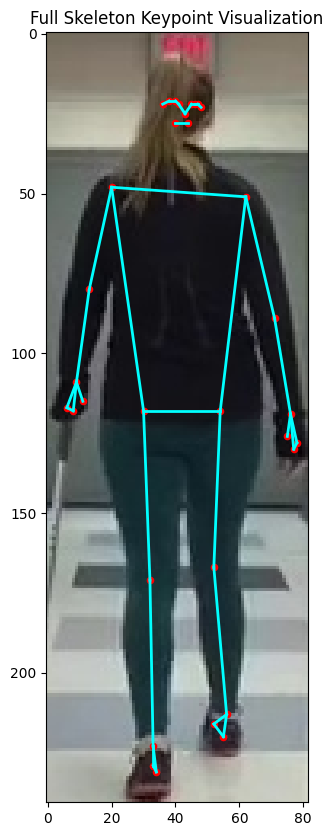

In [65]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import ast
import mediapipe as mp

# Load the cleaned keypoints CSV
cleaned_csv_path = '/kaggle/working/GAVD_with_keypoints_cleaned.csv'
gait_df = pd.read_csv(cleaned_csv_path)

# Pick a random sample
sample_row = gait_df.sample(31).iloc[0]
frame_path = sample_row['frame_path']
keypoints = np.array(ast.literal_eval(sample_row['keypoints'])).reshape(-1, 3)

print(f"Selected Frame: {frame_path}")
print(f"Keypoints Shape: {keypoints.shape}")

# Load the corresponding frame
image = cv2.imread(frame_path)
if image is None:
    print("❌ Failed to load the image.")
else:
    # Convert to RGB for better visualization
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Define the keypoint connections
    mp_pose = mp.solutions.pose
    connections = mp_pose.POSE_CONNECTIONS

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)

    # Plot keypoints and connections
    img_h, img_w, _ = image.shape
    for (x, y, z) in keypoints:
        # Convert normalized coordinates to pixel coordinates
        px = int(x * img_w)
        py = int(y * img_h)
        plt.scatter(px, py, c='red', s=20)

    # Plot the connections
    for start, end in connections:
        start_x, start_y, _ = keypoints[start]
        end_x, end_y, _ = keypoints[end]

        # Convert to pixel coordinates
        start_px = int(start_x * img_w)
        start_py = int(start_y * img_h)
        end_px = int(end_x * img_w)
        end_py = int(end_y * img_h)

        # Draw the line
        plt.plot([start_px, end_px], [start_py, end_py], c='cyan', linewidth=2)

    plt.title("Full Skeleton Keypoint Visualization")
    plt.show()


In [36]:
import pandas as pd
import numpy as np

# Load the cleaned keypoints CSV
cleaned_csv_path = '/kaggle/working/GAVD_with_keypoints_cleaned.csv'
gait_df = pd.read_csv(cleaned_csv_path)

# Verify keypoint lengths
gait_df['keypoint_length'] = gait_df['keypoints'].apply(lambda x: len(eval(x)) if isinstance(x, str) else 0)
invalid_keypoints = gait_df[gait_df['keypoint_length'] != 99]

if len(invalid_keypoints) > 0:
    print(f"\n⚠️ Found {len(invalid_keypoints)} rows with invalid keypoint dimensions:")
    print(invalid_keypoints[['frame_path', 'keypoint_length']].head())
else:
    print("\n✅ All keypoints have the correct 99-dimensional structure.")

# Remove invalid keypoints
gait_df = gait_df[gait_df['keypoint_length'] == 99].reset_index(drop=True)

# Remove the keypoint_length column
gait_df.drop(columns=['keypoint_length'], inplace=True)

# Save the cleaned dataset
final_cleaned_csv_path = '/kaggle/working/GAVD_with_keypoints_final_cleaned.csv'
gait_df.to_csv(final_cleaned_csv_path, index=False)

print("\n✅ Final Cleaned Data Saved to:", final_cleaned_csv_path)


✅ All keypoints have the correct 99-dimensional structure.

✅ Final Cleaned Data Saved to: /kaggle/working/GAVD_with_keypoints_final_cleaned.csv


In [66]:
import os
import pandas as pd
import ast
from tqdm.notebook import tqdm

# ✅ Define the correct input file path
input_csv_path = '/kaggle/working/GAVD_with_keypoints_final_cleaned.csv'
output_csv_path = '/kaggle/working/GAVD_sequences.csv'

# ✅ Verify if the file exists
if not os.path.exists(input_csv_path):
    raise FileNotFoundError(f"❌ File not found: {input_csv_path}")

# ✅ Load the cleaned keypoints file
df = pd.read_csv(input_csv_path)

# ✅ Convert keypoints column to list
df['keypoints'] = df['keypoints'].apply(ast.literal_eval)

# ✅ Define sequence length
SEQ_LEN = 5

# ✅ Sort for proper sequence order
df = df.sort_values(by=['id', 'frame_num']).reset_index(drop=True)

# ✅ Prepare sequences
sequences = []
labels = []

print("🔄 Generating sequences...")

for video_id, group in tqdm(df.groupby('id')):
    keypoints_list = group['keypoints'].tolist()
    label_list = group['gait_pat'].tolist()

    # ✅ Generate fixed-length sequences
    for i in range(0, len(keypoints_list) - SEQ_LEN + 1):
        seq = keypoints_list[i:i + SEQ_LEN]
        label = label_list[i + SEQ_LEN // 2]  # Use middle frame as label
        sequences.append(seq)
        labels.append(label)

# ✅ Create the final sequence DataFrame
sequence_df = pd.DataFrame({
    'sequence': sequences,
    'gait_pat': labels
})

# ✅ Save the sequence dataset
sequence_df.to_csv(output_csv_path, index=False)

print("\n✅ Sequence dataset created successfully!")
print("📝 File saved as:", output_csv_path)

# Display the first few rows of the generated sequences
print("\n📝 Sample Sequences:")
print(sequence_df.head(10))

🔄 Generating sequences...


  0%|          | 0/306 [00:00<?, ?it/s]


✅ Sequence dataset created successfully!
📝 File saved as: /kaggle/working/GAVD_sequences.csv

📝 Sample Sequences:
                                            sequence gait_pat
0  [[0.5552653074264526, 0.09112390875816345, 0.9...   normal
1  [[0.5625922083854675, 0.09367671608924866, 1.0...   normal
2  [[0.569899320602417, 0.09739834070205688, 1.0,...   normal
3  [[0.5570434927940369, 0.09027773141860962, 0.9...   normal
4  [[0.5485621094703674, 0.0965605080127716, 0.89...   normal
5  [[0.5297141075134277, 0.09912213683128357, 0.7...   normal
6  [[0.49542245268821716, 0.0915980339050293, 0.7...   normal
7  [[0.47710466384887695, 0.09445396065711975, 0....   normal
8  [[0.5046509504318237, 0.10105770826339722, 1.0...   normal
9  [[0.5486232042312622, 0.09792423248291016, 0.6...   normal


In [67]:
from sklearn.model_selection import train_test_split

# Load the full sequence dataset
sequence_df = pd.read_csv('/kaggle/working/GAVD_sequences.csv')

# Train-val-test split (stratified)
train_df, temp_df = train_test_split(sequence_df, test_size=0.30, stratify=sequence_df['gait_pat'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.50, stratify=temp_df['gait_pat'], random_state=42)

# Save splits
train_df.to_csv('/kaggle/working/GAVD_train_sequences.csv', index=False)
val_df.to_csv('/kaggle/working/GAVD_val_sequences.csv', index=False)
test_df.to_csv('/kaggle/working/GAVD_test_sequences.csv', index=False)

print("✅ Splits created and saved:")
print(f"📁 Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")


✅ Splits created and saved:
📁 Train: 51034 | Val: 10936 | Test: 10936


In [68]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
import ast
from sklearn.metrics import accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from tqdm.notebook import tqdm

# ✅ Device Configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🚀 Using device: {device}")

# ✅ CNN + BiLSTM Model Definition
class CNNBiLSTMClassifier(nn.Module):
    def __init__(self, input_size=99, cnn_channels=64, lstm_hidden=128, lstm_layers=2, num_classes=8, dropout=0.3):
        super(CNNBiLSTMClassifier, self).__init__()

        # CNN for per-frame spatial feature extraction
        self.conv1 = nn.Conv1d(in_channels=1, out_channels=cnn_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm1d(cnn_channels)
        self.relu = nn.ReLU()

        # BiLSTM for temporal modeling
        self.bilstm = nn.LSTM(
            input_size=cnn_channels,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            dropout=dropout if lstm_layers > 1 else 0,
            batch_first=True,
            bidirectional=True
        )

        # Fully connected layers
        self.dropout = nn.Dropout(dropout)
        self.fc1 = nn.Linear(lstm_hidden * 2, 64)
        self.fc2 = nn.Linear(64, num_classes)

    def forward(self, x):
        # x: [batch_size, seq_len, 99]
        batch_size, seq_len, feat_dim = x.shape

        # Process each frame through CNN
        x = x.view(-1, 1, feat_dim)              # [batch_size * seq_len, 1, 99]
        x = self.relu(self.bn1(self.conv1(x)))   # [batch_size * seq_len, cnn_channels, 99]
        x = F.adaptive_avg_pool1d(x, 1).squeeze(2)  # [batch_size * seq_len, cnn_channels]

        # Reshape back to sequence
        x = x.view(batch_size, seq_len, -1)      # [batch_size, seq_len, cnn_channels]

        # Pass through BiLSTM
        lstm_out, (hn, cn) = self.bilstm(x)      # lstm_out: [batch_size, seq_len, 2 * hidden]
        final_hidden = torch.cat((hn[-2], hn[-1]), dim=1)  # [batch_size, 2 * hidden]

        # Fully connected layers
        x = self.dropout(final_hidden)
        x = self.relu(self.fc1(x))
        x = self.fc2(x)

        return x

# ✅ Custom Dataset Class
class GAVDDataset(Dataset):
    def __init__(self, csv_path, label2id):
        self.df = pd.read_csv(csv_path)
        self.label2id = label2id

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        sequence = torch.tensor(ast.literal_eval(row['sequence']), dtype=torch.float32)
        label = self.label2id[row['gait_pat']]
        return sequence, torch.tensor(label, dtype=torch.long)

# ✅ Create Label Mapping
def create_label_mapping(df):
    label2id = {label: idx for idx, label in enumerate(sorted(df['gait_pat'].unique()))}
    return label2id

# ✅ Load Datasets
train_csv = '/kaggle/working/GAVD_train_sequences.csv'
val_csv = '/kaggle/working/GAVD_val_sequences.csv'
test_csv = '/kaggle/working/GAVD_test_sequences.csv'

label2id = create_label_mapping(pd.read_csv(train_csv))
id2label = {v: k for k, v in label2id.items()}

train_dataset = GAVDDataset(train_csv, label2id)
val_dataset = GAVDDataset(val_csv, label2id)
test_dataset = GAVDDataset(test_csv, label2id)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# ✅ Model Setup
model = CNNBiLSTMClassifier(input_size=99, num_classes=len(label2id)).to(device)

# Optional: Use class weights to handle imbalance
all_labels = [label2id[y] for y in pd.read_csv(train_csv)['gait_pat']]
class_weights = compute_class_weight('balanced', classes=np.unique(all_labels), y=all_labels)
criterion = nn.CrossEntropyLoss(weight=torch.tensor(class_weights, dtype=torch.float32).to(device))

optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)

# ✅ Training and Evaluation Functions
def train_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss, preds, labels = 0, [], []

    for x_batch, y_batch in tqdm(loader, desc="🔄 Training"):
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        output = model(x_batch)
        loss = criterion(output, y_batch)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds.extend(output.argmax(dim=1).cpu().numpy())
        labels.extend(y_batch.cpu().numpy())

    acc = accuracy_score(labels, preds)
    return total_loss / len(loader), acc

def eval_epoch(model, loader, criterion):
    model.eval()
    total_loss, preds, labels = 0, [], []

    with torch.no_grad():
        for x_batch, y_batch in tqdm(loader, desc="🔄 Evaluating"):
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            output = model(x_batch)
            loss = criterion(output, y_batch)
            total_loss += loss.item()

            preds.extend(output.argmax(dim=1).cpu().numpy())
            labels.extend(y_batch.cpu().numpy())

    acc = accuracy_score(labels, preds)
    return total_loss / len(loader), acc

# ✅ Training Loop with Early Stopping
best_val_acc = 0
patience_counter = 0
max_patience = 5

for epoch in range(1, 50):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion)
    val_loss, val_acc = eval_epoch(model, val_loader, criterion)

    print(f"Epoch {epoch:02d} | Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

    # Learning rate scheduler step
    scheduler.step(val_acc)

    # Early stopping logic
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0
        torch.save(model.state_dict(), '/kaggle/working/best_cnn_bilstm_model.pth')
        print("✅ Best model saved.")
    else:
        patience_counter += 1
        if patience_counter >= max_patience:
            print("🛑 Early stopping triggered.")
            break

print("\n✅ Training Complete.")



🚀 Using device: cuda


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 01 | Train Loss: 1.9045, Acc: 0.2535 | Val Loss: 1.7604, Acc: 0.3296
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 02 | Train Loss: 1.7648, Acc: 0.3299 | Val Loss: 1.6948, Acc: 0.3583
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 03 | Train Loss: 1.7223, Acc: 0.3496 | Val Loss: 1.6573, Acc: 0.3788
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 04 | Train Loss: 1.6948, Acc: 0.3602 | Val Loss: 1.6480, Acc: 0.3800
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 05 | Train Loss: 1.6626, Acc: 0.3772 | Val Loss: 1.6505, Acc: 0.3809
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 06 | Train Loss: 1.6299, Acc: 0.3882 | Val Loss: 1.5711, Acc: 0.4125
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 07 | Train Loss: 1.6036, Acc: 0.4000 | Val Loss: 1.5552, Acc: 0.4226
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 08 | Train Loss: 1.5817, Acc: 0.4073 | Val Loss: 1.5204, Acc: 0.4347
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 09 | Train Loss: 1.5608, Acc: 0.4175 | Val Loss: 1.5218, Acc: 0.4339


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 10 | Train Loss: 1.5378, Acc: 0.4275 | Val Loss: 1.4941, Acc: 0.4485
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 11 | Train Loss: 1.5184, Acc: 0.4388 | Val Loss: 1.4761, Acc: 0.4509
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 12 | Train Loss: 1.4952, Acc: 0.4469 | Val Loss: 1.4261, Acc: 0.4738
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 13 | Train Loss: 1.4761, Acc: 0.4513 | Val Loss: 1.4181, Acc: 0.4856
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 14 | Train Loss: 1.4543, Acc: 0.4634 | Val Loss: 1.3819, Acc: 0.5002
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 15 | Train Loss: 1.4361, Acc: 0.4727 | Val Loss: 1.3564, Acc: 0.5121
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 16 | Train Loss: 1.4138, Acc: 0.4804 | Val Loss: 1.3697, Acc: 0.5016


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 17 | Train Loss: 1.3890, Acc: 0.4883 | Val Loss: 1.3116, Acc: 0.5229
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 18 | Train Loss: 1.3682, Acc: 0.4961 | Val Loss: 1.3611, Acc: 0.5083


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 19 | Train Loss: 1.3352, Acc: 0.5127 | Val Loss: 1.2556, Acc: 0.5492
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 20 | Train Loss: 1.3203, Acc: 0.5181 | Val Loss: 1.2249, Acc: 0.5625
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 21 | Train Loss: 1.2970, Acc: 0.5300 | Val Loss: 1.2074, Acc: 0.5712
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 22 | Train Loss: 1.2745, Acc: 0.5364 | Val Loss: 1.2368, Acc: 0.5517


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 23 | Train Loss: 1.2424, Acc: 0.5507 | Val Loss: 1.1897, Acc: 0.5766
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 24 | Train Loss: 1.2290, Acc: 0.5563 | Val Loss: 1.1471, Acc: 0.5948
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 25 | Train Loss: 1.2049, Acc: 0.5628 | Val Loss: 1.1288, Acc: 0.5991
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 26 | Train Loss: 1.1957, Acc: 0.5702 | Val Loss: 1.1892, Acc: 0.5779


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 27 | Train Loss: 1.1686, Acc: 0.5777 | Val Loss: 1.1079, Acc: 0.6010
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 28 | Train Loss: 1.1529, Acc: 0.5825 | Val Loss: 1.1048, Acc: 0.6054
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 29 | Train Loss: 1.1490, Acc: 0.5850 | Val Loss: 1.0680, Acc: 0.6171
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 30 | Train Loss: 1.1260, Acc: 0.5953 | Val Loss: 1.0747, Acc: 0.6187
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 31 | Train Loss: 1.1103, Acc: 0.5991 | Val Loss: 1.0512, Acc: 0.6217
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 32 | Train Loss: 1.0953, Acc: 0.6032 | Val Loss: 1.0226, Acc: 0.6371
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 33 | Train Loss: 1.0816, Acc: 0.6111 | Val Loss: 1.0235, Acc: 0.6351


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 34 | Train Loss: 1.0766, Acc: 0.6117 | Val Loss: 1.0220, Acc: 0.6391
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 35 | Train Loss: 1.0683, Acc: 0.6149 | Val Loss: 1.0197, Acc: 0.6327


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 36 | Train Loss: 1.0540, Acc: 0.6170 | Val Loss: 1.0003, Acc: 0.6452
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 37 | Train Loss: 1.0420, Acc: 0.6237 | Val Loss: 0.9687, Acc: 0.6548
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 38 | Train Loss: 1.0347, Acc: 0.6298 | Val Loss: 0.9812, Acc: 0.6534


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 39 | Train Loss: 1.0133, Acc: 0.6360 | Val Loss: 0.9731, Acc: 0.6526


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 40 | Train Loss: 1.0067, Acc: 0.6360 | Val Loss: 0.9793, Acc: 0.6554
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 41 | Train Loss: 0.9815, Acc: 0.6483 | Val Loss: 0.9371, Acc: 0.6644
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 42 | Train Loss: 0.9842, Acc: 0.6457 | Val Loss: 0.9345, Acc: 0.6706
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 43 | Train Loss: 0.9816, Acc: 0.6472 | Val Loss: 0.9593, Acc: 0.6615


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 44 | Train Loss: 0.9643, Acc: 0.6530 | Val Loss: 0.9420, Acc: 0.6661


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 45 | Train Loss: 0.9598, Acc: 0.6528 | Val Loss: 0.9233, Acc: 0.6715
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 46 | Train Loss: 0.9553, Acc: 0.6556 | Val Loss: 0.9352, Acc: 0.6661


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 47 | Train Loss: 0.9398, Acc: 0.6623 | Val Loss: 0.9443, Acc: 0.6664


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 48 | Train Loss: 0.9297, Acc: 0.6668 | Val Loss: 0.9208, Acc: 0.6811
✅ Best model saved.


🔄 Training:   0%|          | 0/798 [00:00<?, ?it/s]

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]

Epoch 49 | Train Loss: 0.9180, Acc: 0.6682 | Val Loss: 0.9313, Acc: 0.6651

✅ Training Complete.


🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]


✅ Test Set Accuracy: 0.6771


In [69]:

# ✅ Test the Model
model.load_state_dict(torch.load('/kaggle/working/best_cnn_bilstm_model.pth'))
test_loss, test_acc = eval_epoch(model, test_loader, criterion)

print(f"\n✅ Test Set Accuracy: {test_acc:.4f}")

# ✅ Classification Report
all_preds, all_labels = [], []

with torch.no_grad():
    for x_batch, y_batch in test_loader:
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)
        output = model(x_batch)
        preds = output.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(y_batch.cpu().numpy())

print("\n📋 Classification Report:")
print(classification_report(all_labels, all_preds, target_names=list(label2id.keys())))

🔄 Evaluating:   0%|          | 0/171 [00:00<?, ?it/s]


✅ Test Set Accuracy: 0.6771

📋 Classification Report:
                precision    recall  f1-score   support

      abnormal       0.59      0.51      0.55      1419
cerebral palsy       0.74      0.77      0.75      1525
      exercise       0.69      0.59      0.64      1464
     myopathic       0.60      0.62      0.61      1435
        normal       0.53      0.59      0.56      1051
    parkinsons       0.71      0.81      0.75      1121
    prosthetic       0.77      0.76      0.77      1402
        stroke       0.74      0.76      0.75      1519

      accuracy                           0.68     10936
     macro avg       0.67      0.68      0.67     10936
  weighted avg       0.68      0.68      0.68     10936



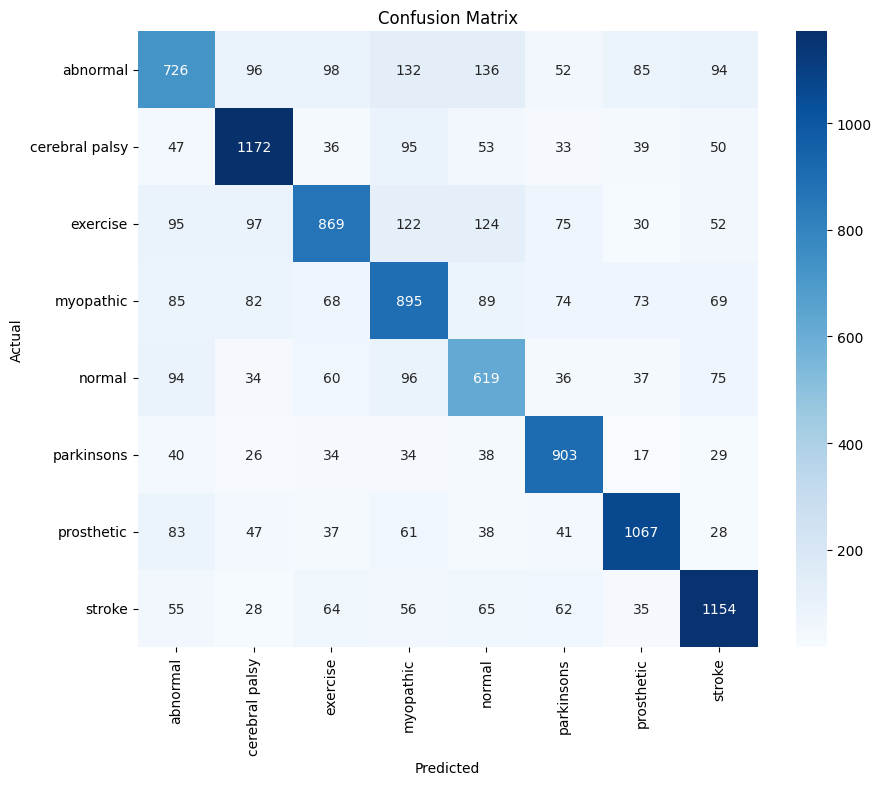

⚖️ Balanced Accuracy: 0.6766
📊 Matthews Correlation Coefficient (MCC): 0.6309
🧮 Cohen’s Kappa Score: 0.6305


In [75]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(label2id.keys()),
            yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


from sklearn.metrics import balanced_accuracy_score

balanced_acc = balanced_accuracy_score(all_labels, all_preds)
print(f"⚖️ Balanced Accuracy: {balanced_acc:.4f}")


from sklearn.metrics import matthews_corrcoef

mcc = matthews_corrcoef(all_labels, all_preds)
print(f"📊 Matthews Correlation Coefficient (MCC): {mcc:.4f}")


from sklearn.metrics import cohen_kappa_score

kappa = cohen_kappa_score(all_labels, all_preds)
print(f"🧮 Cohen’s Kappa Score: {kappa:.4f}")
